In [15]:
import pandas as pd
from preprocess_nifti import *
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

In [2]:
data_dir = 'data/amyloid_pet'

mni_path = os.path.join('mni', 'icbm152.nii')
mni_img = load_img(mni_path)

aal = fetch_atlas_aal(version='3v2')
atlas_img = load_img(aal.maps)

masker = NiftiLabelsMasker(labels_img=atlas_img, standardize=True, strategy='sum')

label_index_map = {
    index: region for index, region in zip(aal.indices, aal.labels)
}
print(label_index_map)

[fetch_atlas_aal] Dataset found in C:\Users\Dhruv Khanna\nilearn_data\aal_3v2

{'0': 'Background', '1': 'Precentral_L', '2': 'Precentral_R', '3': 'Frontal_Sup_2_L', '4': 'Frontal_Sup_2_R', '5': 'Frontal_Mid_2_L', '6': 'Frontal_Mid_2_R', '7': 'Frontal_Inf_Oper_L', '8': 'Frontal_Inf_Oper_R', '9': 'Frontal_Inf_Tri_L', '10': 'Frontal_Inf_Tri_R', '11': 'Frontal_Inf_Orb_2_L', '12': 'Frontal_Inf_Orb_2_R', '13': 'Rolandic_Oper_L', '14': 'Rolandic_Oper_R', '15': 'Supp_Motor_Area_L', '16': 'Supp_Motor_Area_R', '17': 'Olfactory_L', '18': 'Olfactory_R', '19': 'Frontal_Sup_Medial_L', '20': 'Frontal_Sup_Medial_R', '21': 'Frontal_Med_Orb_L', '22': 'Frontal_Med_Orb_R', '23': 'Rectus_L', '24': 'Rectus_R', '25': 'OFCmed_L', '26': 'OFCmed_R', '27': 'OFCant_L', '28': 'OFCant_R', '29': 'OFCpost_L', '30': 'OFCpost_R', '31': 'OFClat_L', '32': 'OFClat_R', '33': 'Insula_L', '34': 'Insula_R', '37': 'Cingulate_Mid_L', '38': 'Cingulate_Mid_R', '39': 'Cingulate_Post_L', '40': 'Cingulate_Post_R', '41': 'Hippocampus_L', '42': 'Hippocampus_R', '43': 'ParaHippocampal_L', '44': 'ParaHippocampal_R

In [3]:
results = {}
for file in os.listdir(data_dir):
    if not file.endswith('.nii'):
        continue
    print(f'Processing {file}')
    registered_image = register_image_to_template(os.path.join(data_dir, file), mni_img)
    suvrs = compute_suvr(registered_image, atlas_img, is_global = False)
    # Modify every key in the suvrs dictionary to instead be the region name using the label_index_map
    suvr_regions = {label_index_map[key]: value for key, value in suvrs.items()}
    results[file] = suvr_regions

Processing AD_normalised_009_S_5027.nii


C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\preprocess_nifti.py:23: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  registered_img = resample_to_img(img, mni_img)
C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\preprocess_nifti.py:23: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  registered_img = resample_to_img(img, mni_img)
C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\.venv\Lib\site-packages\joblib\memory.py:326: UserWarning: Standardization of 3D signal has been requested but would lead to zero values. Skipping.
  return self.func(*args, **kwargs)
C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\preprocess_nifti.py:23: FutureWarning: 'force_resample' will be set to 'T

Processing AD_normalised_011_S_4845.nii


C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\.venv\Lib\site-packages\joblib\memory.py:326: UserWarning: Standardization of 3D signal has been requested but would lead to zero values. Skipping.
  return self.func(*args, **kwargs)
C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\preprocess_nifti.py:23: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  registered_img = resample_to_img(img, mni_img)
C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\preprocess_nifti.py:23: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  registered_img = resample_to_img(img, mni_img)


Processing AD_normalised_053_S_5070.nii


C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\.venv\Lib\site-packages\joblib\memory.py:326: UserWarning: Standardization of 3D signal has been requested but would lead to zero values. Skipping.
  return self.func(*args, **kwargs)
C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\preprocess_nifti.py:23: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  registered_img = resample_to_img(img, mni_img)
C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\preprocess_nifti.py:23: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  registered_img = resample_to_img(img, mni_img)


Processing AD_normalised_094_S_4089.nii


C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\.venv\Lib\site-packages\joblib\memory.py:326: UserWarning: Standardization of 3D signal has been requested but would lead to zero values. Skipping.
  return self.func(*args, **kwargs)
C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\preprocess_nifti.py:23: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  registered_img = resample_to_img(img, mni_img)
C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\preprocess_nifti.py:23: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  registered_img = resample_to_img(img, mni_img)


Processing AD_normalised_100_S_5106.nii


C:\Users\Dhruv Khanna\Documents\Coding stuff\ADML\.venv\Lib\site-packages\joblib\memory.py:326: UserWarning: Standardization of 3D signal has been requested but would lead to zero values. Skipping.
  return self.func(*args, **kwargs)


In [5]:
results_df = pd.DataFrame()
for file, suvr in results.items():
    # From the file extract the patient ID by removing the file extension and removing the prefix
    patient_id = file.split('.')[0].replace('AD_normalised_', '')
    # print(f'Patient ID: {patient_id}, SUVR = {suvr}', end='\n\n')
    # Store in a dataframe with the patient ID column and each of the suvr regions as columns with corresponding values
    df = pd.DataFrame([suvr], index=[patient_id])
    df.index.name = 'Patient ID'
    results_df = pd.concat([results_df, df])
results_df.head()
# results_df.to_csv(os.path.join(data_dir, 'amyloid_pet_suvr_check_results_with_cerebellum.csv'))

,Background,Precentral_L,Precentral_R,Frontal_Sup_2_L,Frontal_Sup_2_R,Frontal_Mid_2_L,Frontal_Mid_2_R,Frontal_Inf_Oper_L,Frontal_Inf_Oper_R,Frontal_Inf_Tri_L,...,VTA_R,SN_pc_L,SN_pc_R,SN_pr_L,SN_pr_R,Red_N_L,Red_N_R,LC_L,LC_R,Raphe_D
Patient ID,,,,,,,,,,,,,,,,,,,,,
009_S_5027,0.324408,0.279725,0.470893,0.510951,0.447557,0.454637,0.111888,0.133693,0.252911,0.190772,...,0.003057,0.003033,0.004843,0.006740,0.005173,0.005416,0.000484,0.000298,0.001688,0.000388
011_S_4845,0.282607,0.251579,0.414770,0.445885,0.390309,0.412560,0.093835,0.112524,0.230758,0.182893,...,0.002702,0.002711,0.004161,0.005761,0.004720,0.005098,0.000428,0.000268,0.001513,0.000402
053_S_5070,0.394299,0.364816,0.549752,0.610472,0.508576,0.551268,0.104718,0.139500,0.275557,0.231486,...,0.003530,0.003365,0.004991,0.007233,0.005808,0.006107,0.000529,0.000329,0.001722,0.000439
094_S_4089,0.385316,0.340071,0.588047,0.612372,0.564124,0.574865,0.130345,0.159791,0.317471,0.242597,...,0.003917,0.003471,0.005779,0.007386,0.006764,0.007000,0.000584,0.000353,0.001939,0.000513
100_S_5106,0.333379,0.308061,0.523010,0.547265,0.499713,0.521794,0.118586,0.142385,0.297897,0.231840,...,0.003484,0.003293,0.004916,0.006945,0.005774,0.005808,0.000525,0.000298,0.001822,0.000435


In [12]:
test_df = pd.read_csv(os.path.join(data_dir, 'test_results.csv'), index_col='PTID')
test_df.drop(columns=['Unnamed: 0', 'index'], inplace=True)
test_df.head()

,SUVr_ACC_pre_L.nii,SUVr_ACC_pre_R.nii,SUVr_ACC_sub_L.nii,SUVr_ACC_sub_R.nii,SUVr_ACC_sup_L.nii,SUVr_ACC_sup_R.nii,SUVr_Amygdala_L.nii,SUVr_Amygdala_R.nii,SUVr_Angular_L.nii,SUVr_Angular_R.nii,...,SUVr_Vermis_1_2.nii,SUVr_Vermis_3.nii,SUVr_Vermis_4_5.nii,SUVr_Vermis_6.nii,SUVr_Vermis_7.nii,SUVr_Vermis_8.nii,SUVr_Vermis_9.nii,SUVr_Vermis_10.nii,SUVr_VTA_L.nii,SUVr_VTA_R.nii
PTID,,,,,,,,,,,,,,,,,,,,,
011_S_4845,0.046375,0.052554,0.014201,0.010934,0.045154,0.042277,0.011064,0.014424,0.078568,0.111045,...,0.003199,0.011210,0.032814,0.021571,0.010029,0.014175,0.009536,0.006044,0.000651,0.000606
053_S_5070,0.055244,0.066686,0.017149,0.014206,0.053644,0.055676,0.013901,0.017885,0.105126,0.155466,...,0.003495,0.011934,0.042746,0.022824,0.010812,0.014619,0.009409,0.005556,0.000883,0.000763
009_S_5027,0.048747,0.052013,0.015095,0.011290,0.048013,0.043332,0.012276,0.014224,0.087324,0.122891,...,0.003535,0.012276,0.035398,0.020153,0.009684,0.013857,0.009779,0.006749,0.000685,0.000701
100_S_5106,0.054566,0.062472,0.016453,0.013176,0.052684,0.052129,0.011538,0.015350,0.097917,0.130605,...,0.003556,0.011812,0.034176,0.018022,0.008666,0.013024,0.010496,0.006778,0.000765,0.000741
094_S_4089,0.066783,0.072477,0.018632,0.014086,0.059445,0.055823,0.015853,0.020940,0.106215,0.125333,...,0.003912,0.011781,0.033544,0.017660,0.009587,0.015634,0.010546,0.007498,0.000888,0.000793


In [ ]:
# Plot the distributions of test_df and results_df for each region
def plot_distributions(test_df, results_df):
    matlab_regions = test_df.columns[1:]  # Exclude 'Patient ID' column
    python_regions = results_df.columns[1:]
    for index in range(len(matlab_regions)):
        test_region = matlab_regions[index]
        atlas_region = python_regions[index]
        plt.figure(figsize=(12, 6))
        sns.kdeplot(test_df[test_region], label='Matlab', color='blue', fill=True, alpha=0.5)
        sns.kdeplot(results_df[atlas_region], label='Python', color='orange', fill=True, alpha=0.5)
        plt.title(f'Distribution of {test_region}/{atlas_region}')
        plt.xlabel('SUVR')
        plt.ylabel('Density')
        plt.legend()
        plt.grid()
        plt.show()

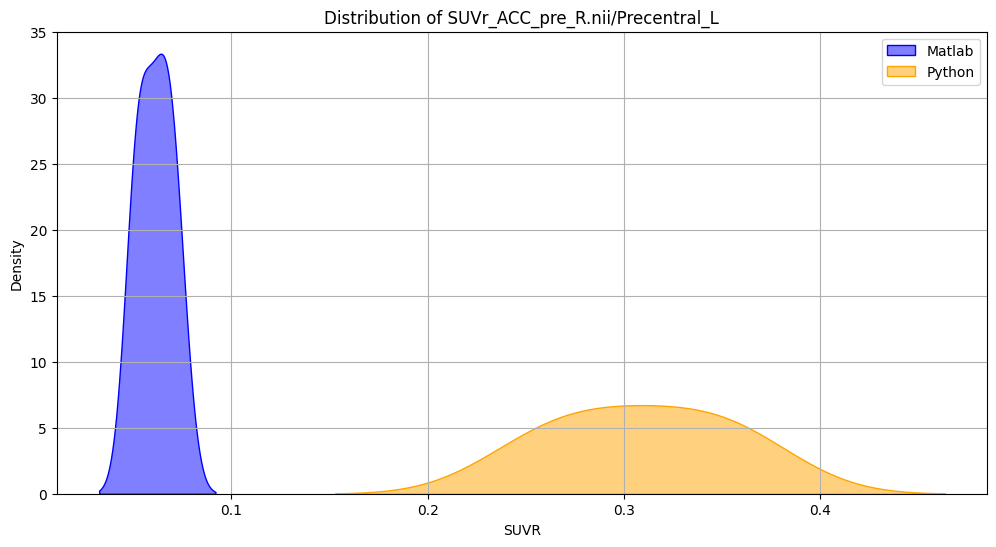

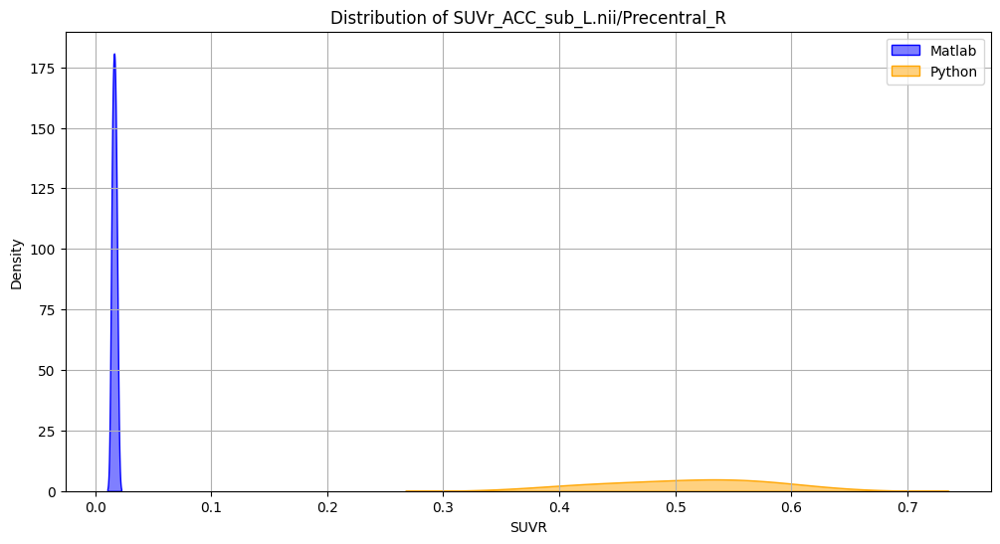

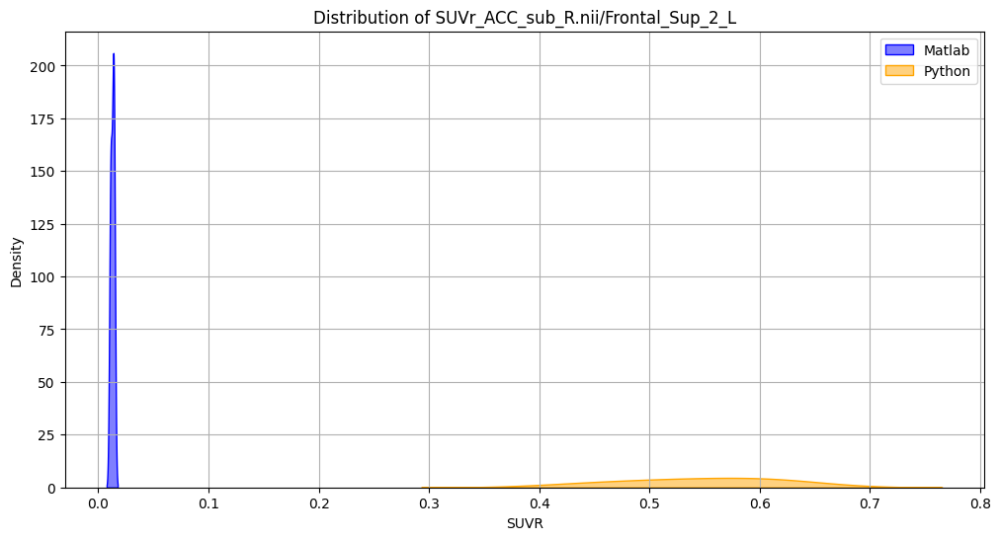

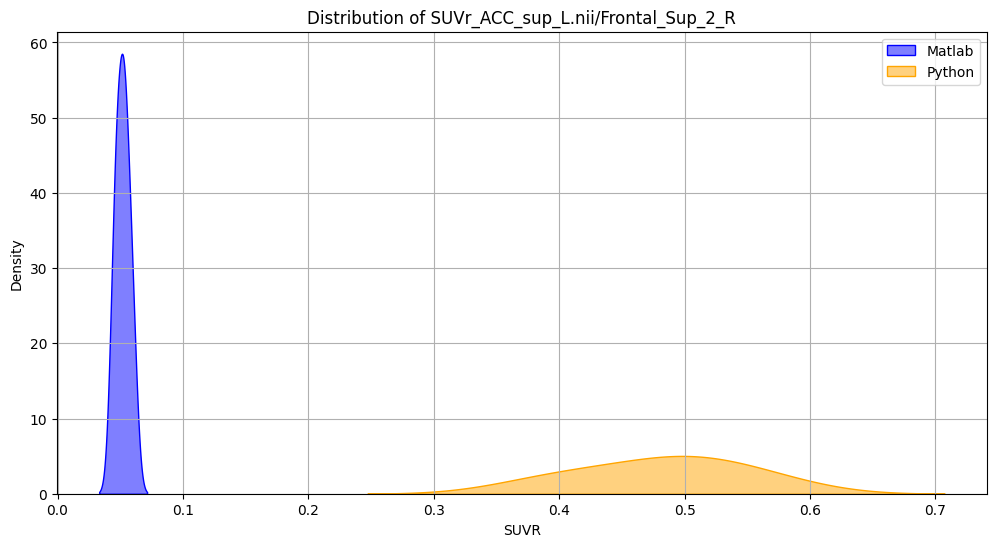

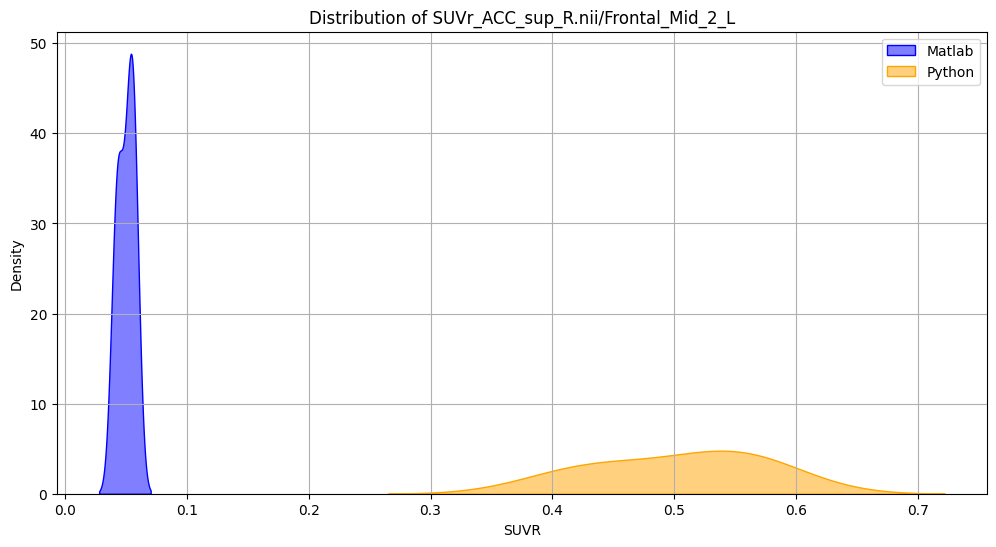

...

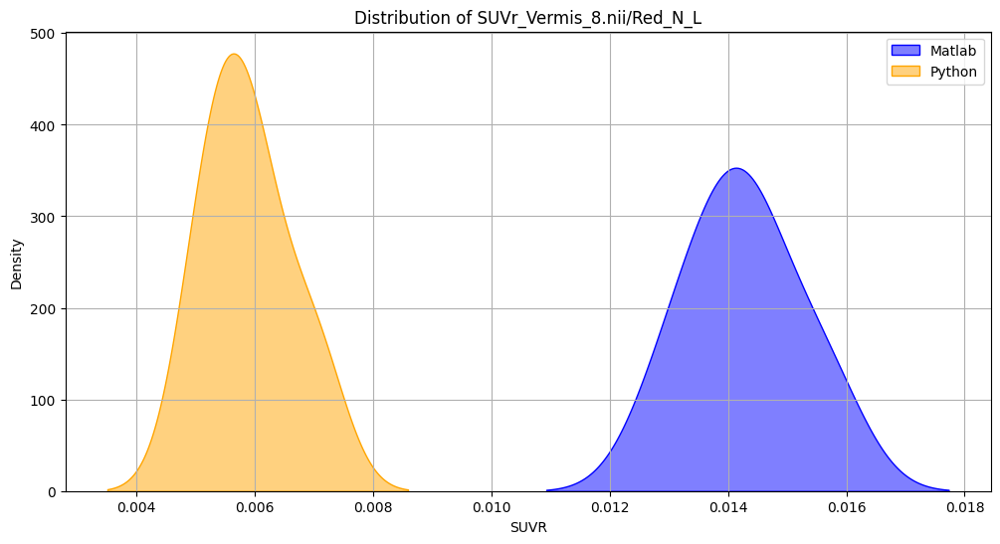

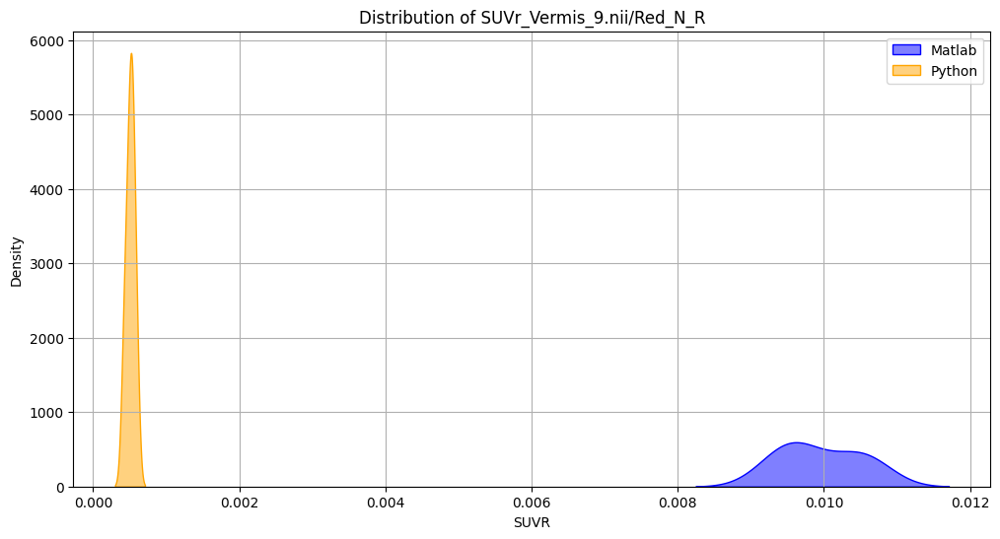

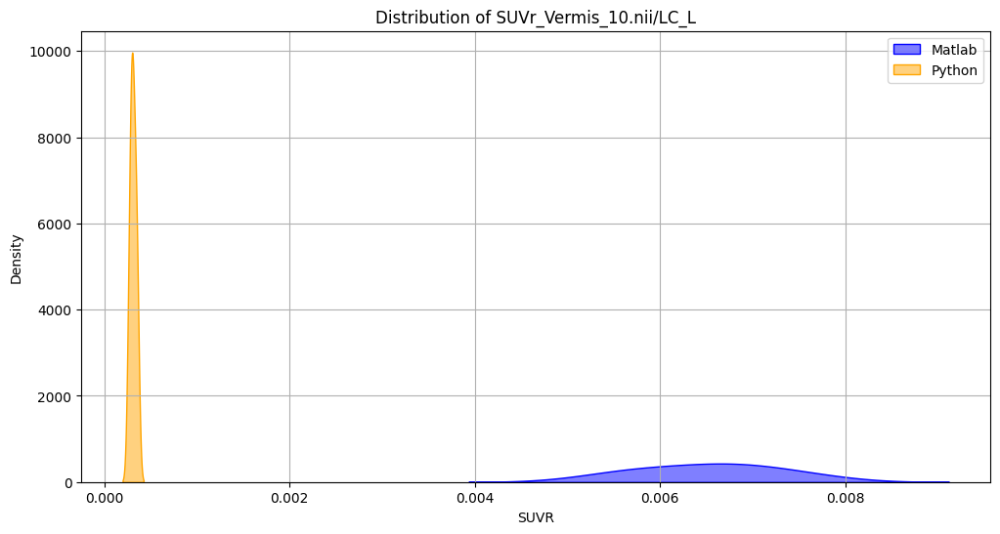

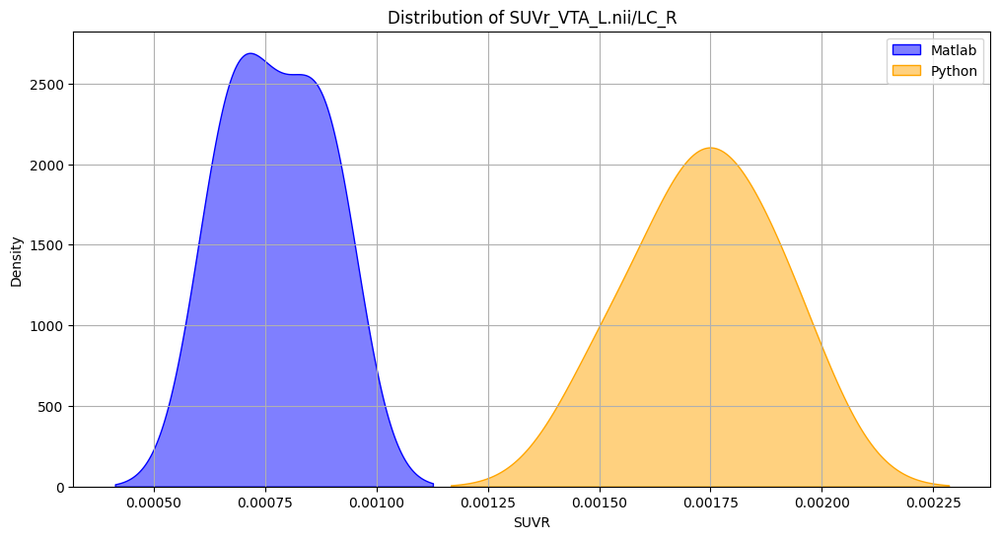

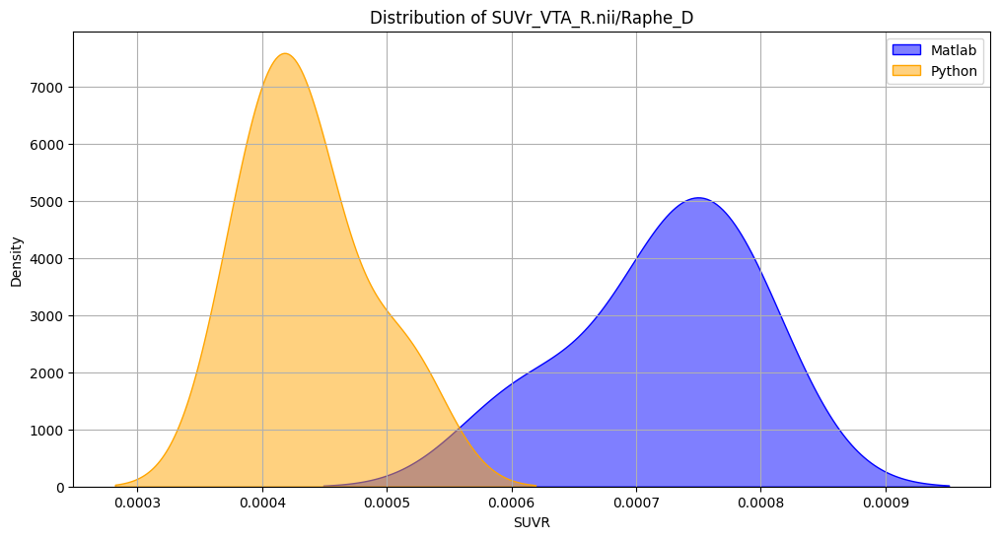

In [14]:
plot_distributions(test_df, results_df)

In [16]:
# Standard scaler to scale the results_df and test_df independently
scaler = StandardScaler()
test_scaled = scaler.fit_transform(test_df.iloc[:, 1:])  # Exclude 'Patient ID' column
results_scaled = scaler.fit_transform(results_df.iloc[:, 1:])  # Exclude 'Patient ID' column
test_scaled_df, results_scaled_df = pd.DataFrame(test_scaled, columns=test_df.columns[1:], index=test_df.index), pd.DataFrame(results_scaled, columns=results_df.columns[1:], index=results_df.index)

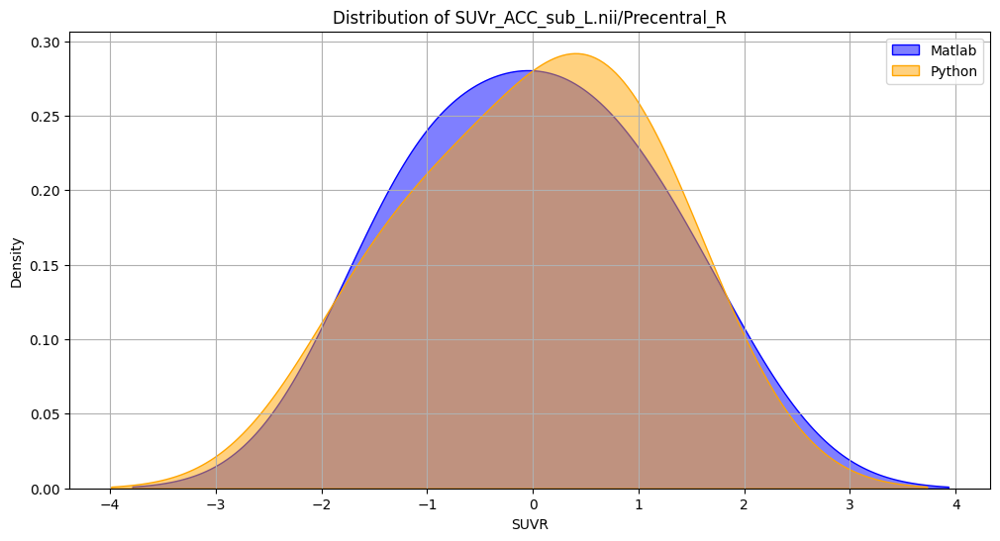

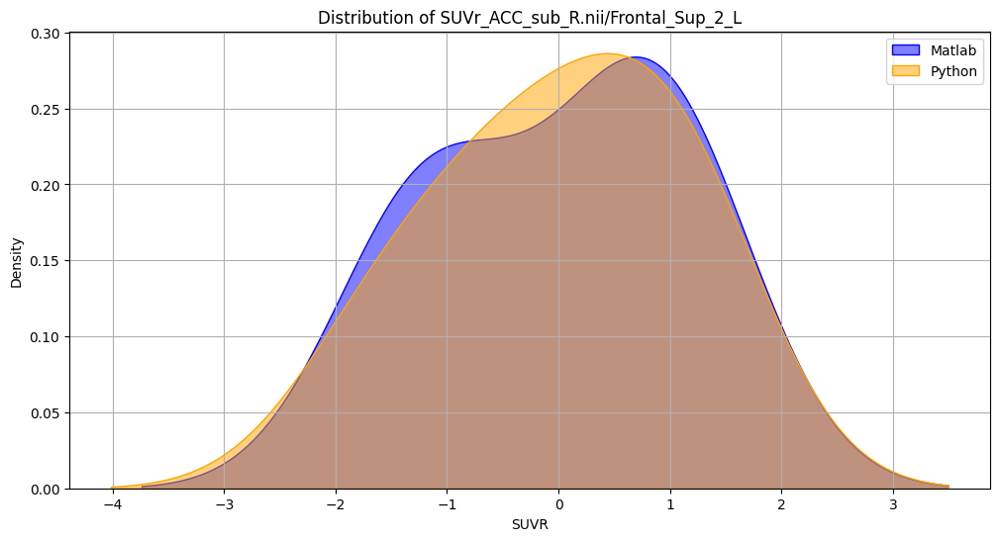

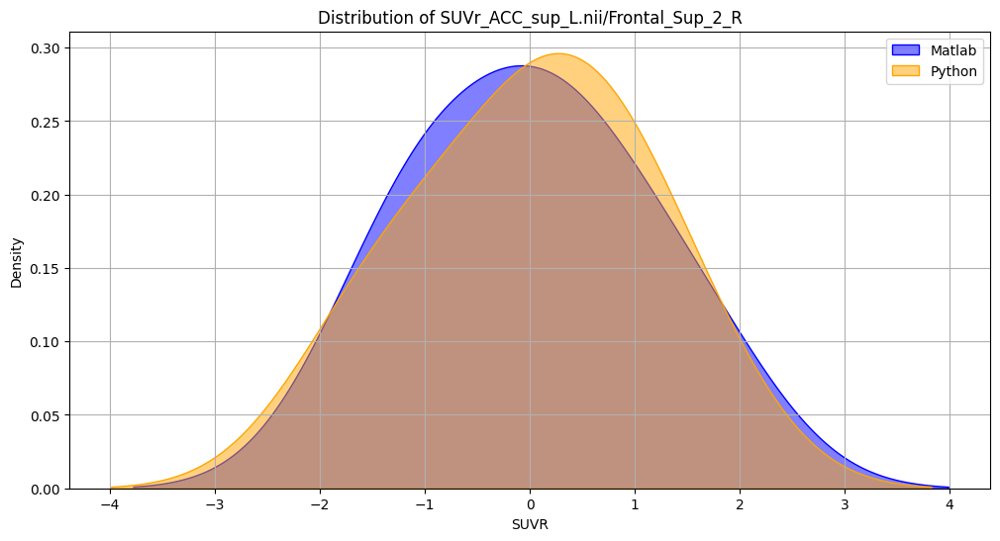

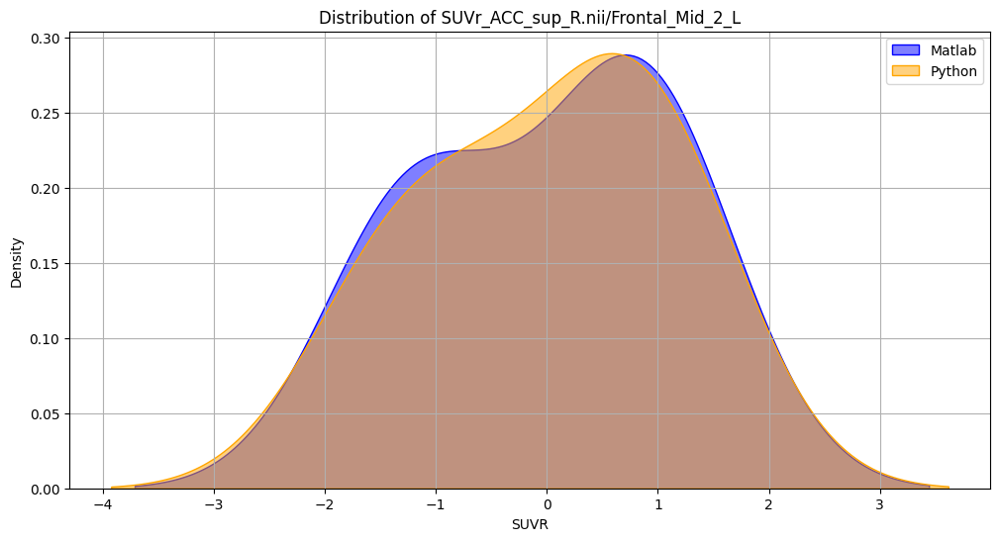

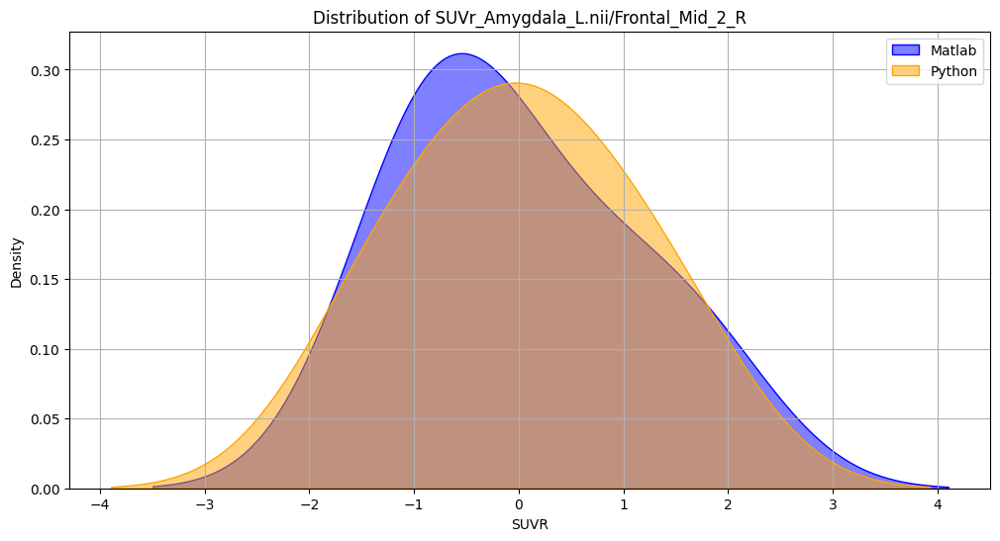

...

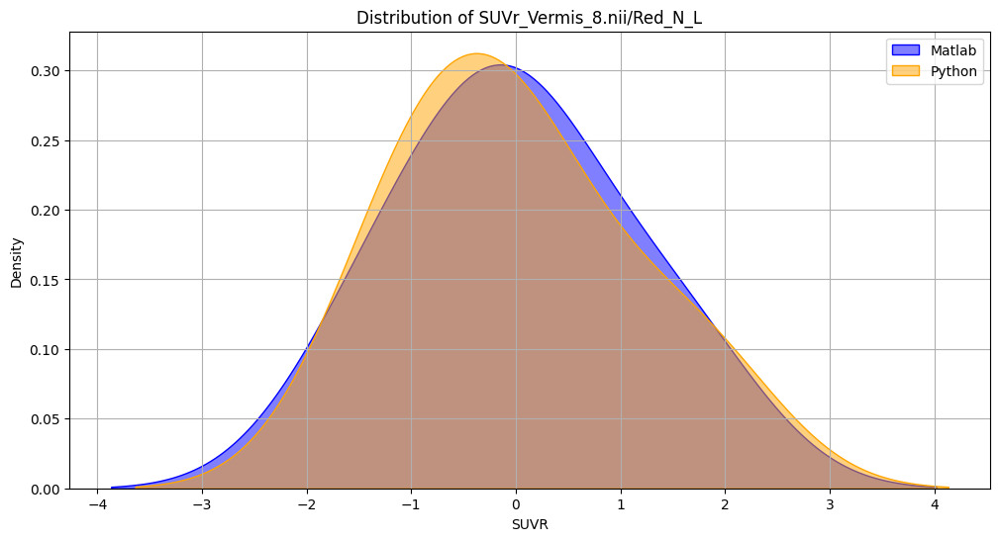

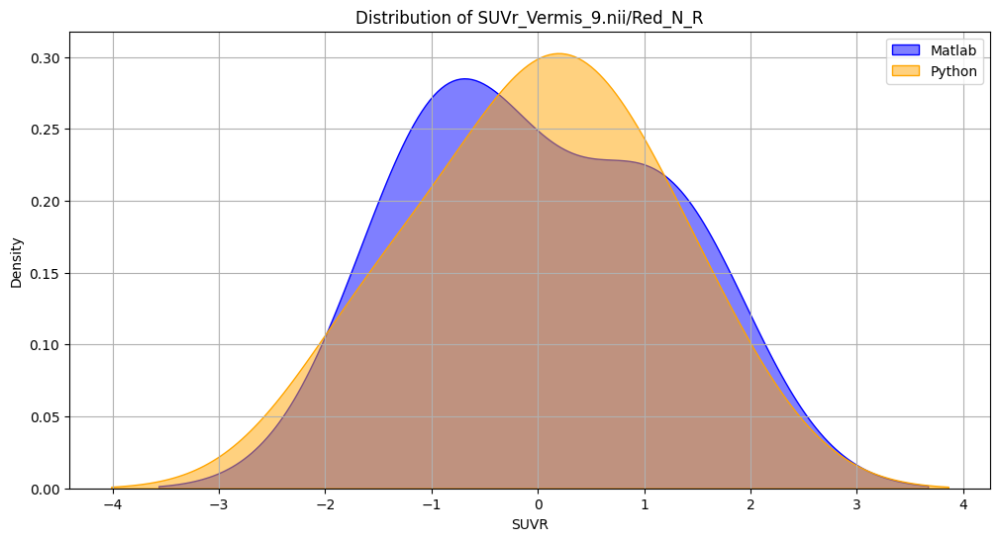

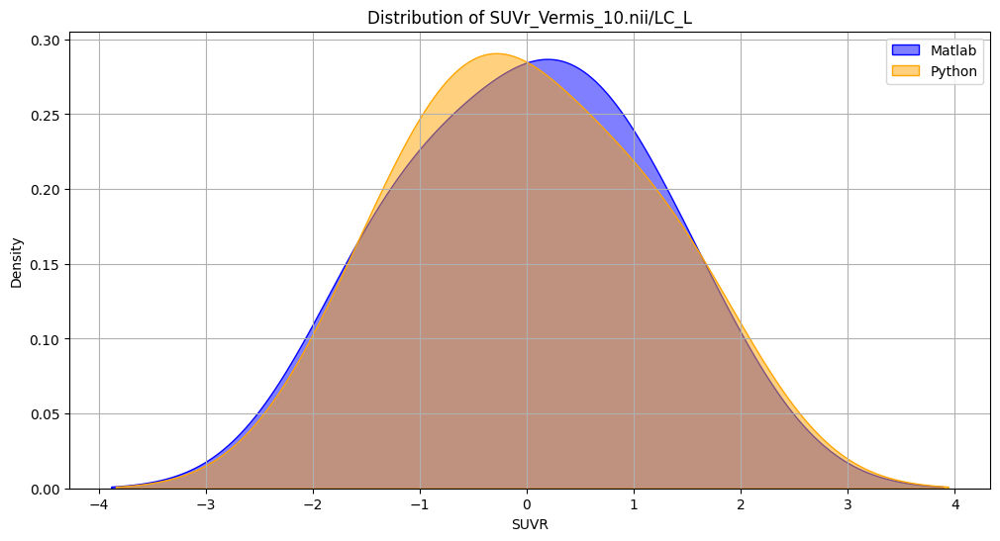

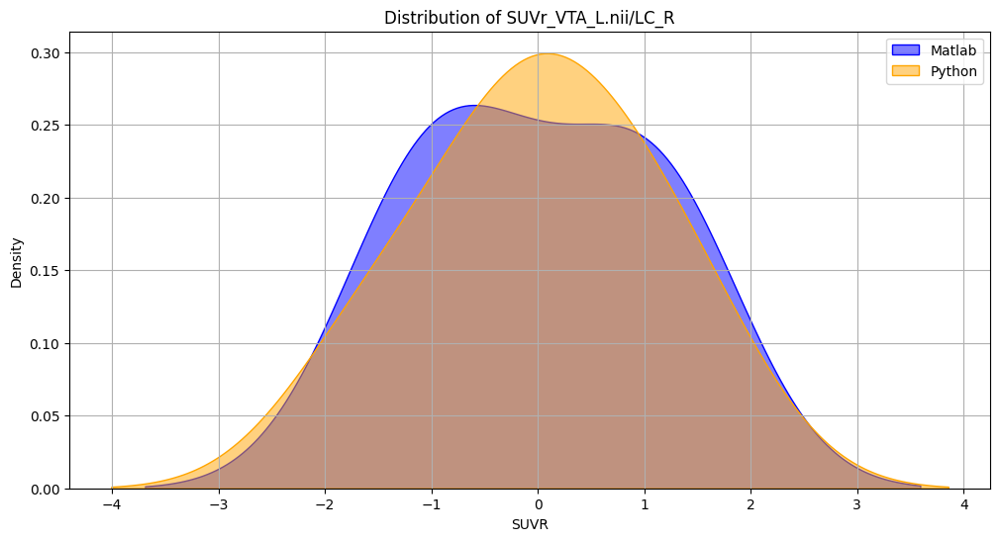

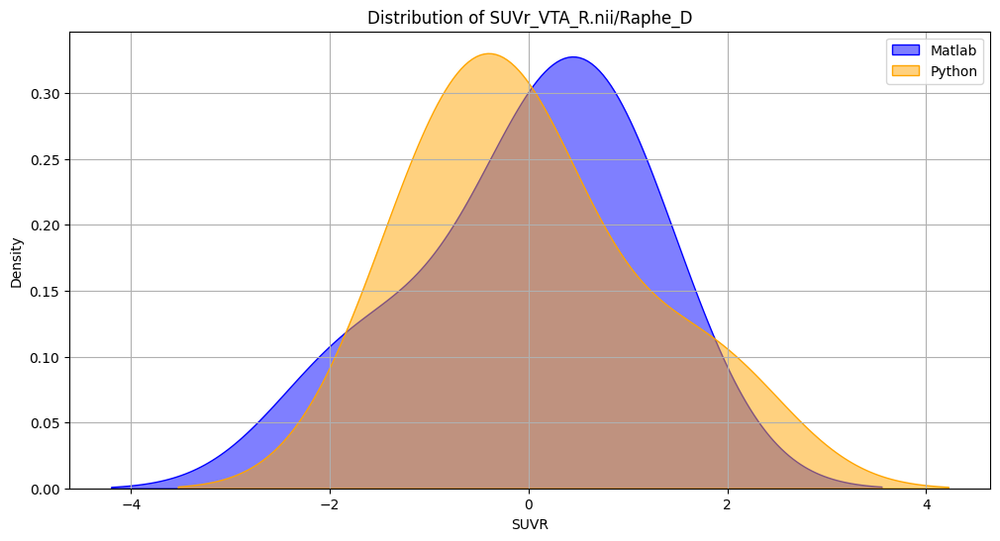

In [17]:
plot_distributions(test_scaled_df, results_scaled_df)